# Creating a racing bar plot animation of corona affected patients
### _Importing libraries and dataset:_

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
import random
from datetime import datetime

In [2]:
# Importing dataset
df = pd.read_csv(r'D:\Work docs\Python datasets\County wise time series data\time_series_covid_19_deaths.csv')

In [7]:
df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,7,11,14,14,15,15,18,18,21,23
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,20,21,22,22,23,23,23,23,23,24
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,152,173,193,205,235,256,275,293,313,326
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,18,21,22,23,25,26,26,29,29,31
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2


In [8]:
print(df.shape)

(264, 88)


In [9]:
# Dropping unwanted columns as a preparation for melting
df1 = df.drop(['Lat', 'Long', 'Province/State'], axis=1)

In [10]:
df1.head()

,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20
0,Afghanistan,0,0,0,0,0,0,0,0,0,...,7,11,14,14,15,15,18,18,21,23
1,Albania,0,0,0,0,0,0,0,0,0,...,20,21,22,22,23,23,23,23,23,24
2,Algeria,0,0,0,0,0,0,0,0,0,...,152,173,193,205,235,256,275,293,313,326
3,Andorra,0,0,0,0,0,0,0,0,0,...,18,21,22,23,25,26,26,29,29,31
4,Angola,0,0,0,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2


### _Transforming dataframe structure by melting:_

In [11]:
df2 = pd.melt(df1, id_vars = ['Country/Region'], var_name = 'Date', value_name = 'Deaths')

In [12]:
df2.head()

,Country/Region,Date,Deaths
0,Afghanistan,1/22/20,0
1,Albania,1/22/20,0
2,Algeria,1/22/20,0
3,Andorra,1/22/20,0
4,Angola,1/22/20,0


In [13]:
df2.shape

(22176, 3)

In [14]:
df2.columns = ['Country', 'Date', 'Deaths']

In [15]:
df2.head()

,Country,Date,Deaths
0,Afghanistan,1/22/20,0
1,Albania,1/22/20,0
2,Algeria,1/22/20,0
3,Andorra,1/22/20,0
4,Angola,1/22/20,0


In [16]:
df2.dtypes

Country    object
Date       object
Deaths      int64
dtype: object

In [17]:
# Converting datatype of 'Date' from into to data-type
df2.Date = pd.to_datetime(df2['Date'])

In [18]:
df2.head()

,Country,Date,Deaths
0,Afghanistan,2020-01-22,0
1,Albania,2020-01-22,0
2,Algeria,2020-01-22,0
3,Andorra,2020-01-22,0
4,Angola,2020-01-22,0


In [19]:
grp = df2.groupby(['Country', 'Date'], as_index = False).agg(np.sum)

In [20]:
grp.head()

,Country,Date,Deaths
0,Afghanistan,2020-01-22,0
1,Afghanistan,2020-01-23,0
2,Afghanistan,2020-01-24,0
3,Afghanistan,2020-01-25,0
4,Afghanistan,2020-01-26,0


In [21]:
df = grp.sort_values(by='Deaths', ascending=False)

In [22]:
curr_date = '2020-04-14'

dff = df[df['Date'] == curr_date].sort_values(by = 'Deaths', ascending = False).head(10)

<BarContainer object of 10 artists>

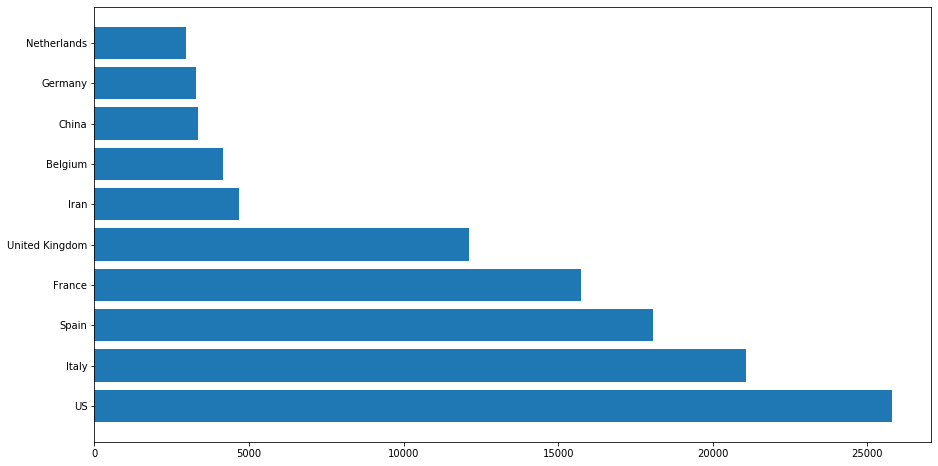

In [23]:
fig, ax = plt.subplots(figsize = (15,8))
ax.barh(dff['Country'], dff['Deaths'])

### _Defining unique color for each country in the barplot_

In [48]:
number_of_colors = len(np.unique(df['Country']))

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]

countries = np.unique(df['Country'])


In [49]:
color_dict = dict(zip(countries.tolist(),colors))

### _Defining chart of a static barplot:_

Text(1, 0.4, '2020-04-14')

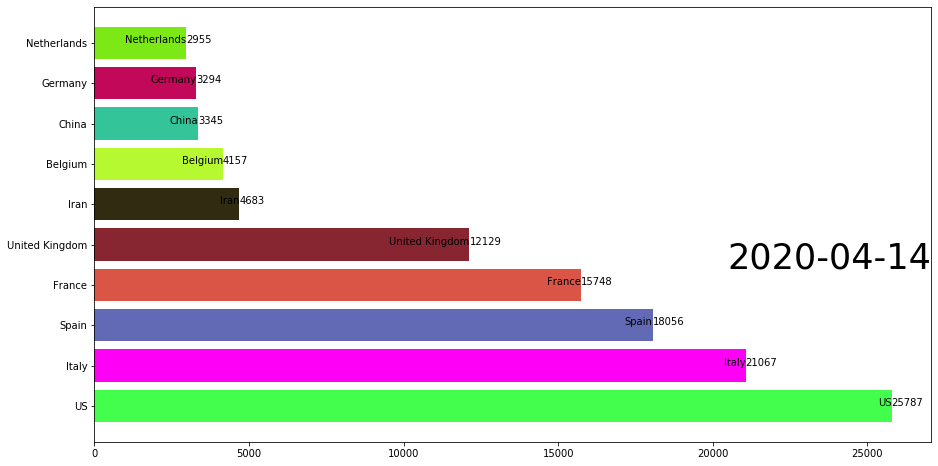

In [50]:
fig, ax = plt.subplots(figsize=(15, 8))
dff = dff[::-1]   # flip values from top to bottom

# pass colors values to `color=`

ax.barh(dff['Country'], dff['Deaths'], color=[color_dict[x] for x in dff['Country']])

# iterate over the values to plot labels and values (Tokyo, Asia, 38194.2)

for i, (value, name) in enumerate(zip(dff['Deaths'], dff['Country'])):
    ax.text(value, i,     name,            ha='right')  
    ax.text(value, i,     value,           ha='left')   

    # Add year right middle portion of canvas
ax.text(1, 0.4, curr_date, transform=ax.transAxes, size=35, ha='right')

### _Defining a function to generate barplot with all necessary aesthetics:_

In [51]:
def go_corona(date):
    dff = df[df['Date'] == date].sort_values(by='Deaths', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff['Country'], dff['Deaths'], color=[color_dict[x] for x in dff['Country']])
    dx = dff['Deaths'].max() / 200
    for i, (value, name) in enumerate(zip(dff['Deaths'], dff['Country'])):
        ax.text(value-dx, i,     name,           size=12, weight=400, ha='right')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    
    # ... polished styles
    ax.text(1, 0.4, date.strftime('%b %d %Y'), transform=ax.transAxes, color='#777777', size=35, ha='right', weight=800)
    ax.text(0, 1.06, 'Deaths', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-', color = 'lightgrey')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, 'Highest Corona Deaths By Country - April 2020',
            transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'by @arvind_elangovan', transform=ax.transAxes, ha='right',
            color='#777777', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
#go_corona(curr_date)

### _Animated version of barplot using html view:_

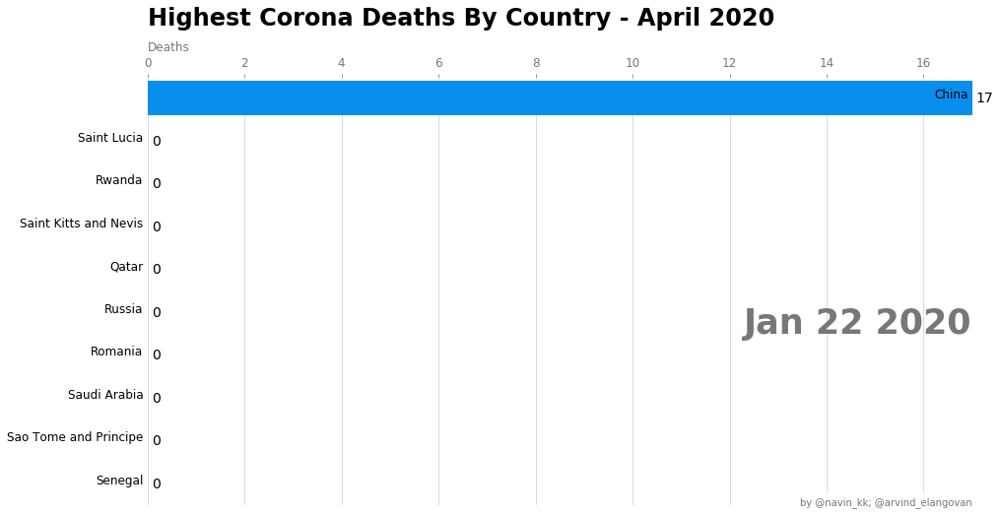

In [55]:
import matplotlib.animation as animation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, go_corona, frames= [i for i in pd.date_range(start=df['Date'].min(), end = df['Date'].max()) for r in range(3)]) 
HTML(animator.to_jshtml()) 